In [1]:
import tensorflow as tf
import numpy as np
import tensorflow_datasets as tfds
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
from numpy import zeros
from numpy.random import randint

import warnings
warnings.filterwarnings('ignore')

In [2]:
try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
    IS_COLAB = True
except Exception:
    IS_COLAB = False

data_dir=None
if IS_COLAB:
    data_dir = "data"
else:
# configuración local para evitar errores de memoria
    gpu_devices = tf.config.experimental.list_physical_devices('GPU')
    for device in gpu_devices:
        tf.config.experimental.set_memory_growth(device, True)

In [3]:
def plot_multiple_images(images,title, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols*4, n_rows*3))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.title(title)
        plt.imshow(np.clip(image,0,255))
        plt.axis("off")

In [4]:
(train_dataset, val_dataset), dataset_info = tfds.load(
    "coco/2017", split=["train", "validation"], with_info=True,data_dir=data_dir)

In [5]:
classes = dataset_info.features['objects']['label'].names

In [6]:
def generate_labels(n_batch):
    lbl_rnd = [[x for x in randint(0,80,randint(1,10,1))] for a in range(0,n_batch)]
    lbl_zeros = np.zeros((n_batch,80))
    lbl_classes = []
    for n in range(n_batch):
        cnt_lbl = [x for x in randint(1,10,len(lbl_rnd[n]))]
        lbl_zeros[n][lbl_rnd[n]] = cnt_lbl
        dct = {classes[i]:cnt_lbl[lbl_rnd[n].index(i)] for i in lbl_rnd[n]}
        #print(lbl_rnd[n],cnt_lbl,dct)
        lbl_classes.append(dct)
    return lbl_zeros,lbl_classes

def cgan_predict(model_path,title,labels,latent_dim,n_batch):
    lbl_fake = tf.constant(labels)
    noise = tf.random.normal(shape=[n_batch, latent_dim])
    g_model = load_model(model_path)
    g_img = g_model.predict([noise,lbl_fake])
    plot_multiple_images(g_img,title)

In [7]:
cnt_img = 3
vct_labels,cls_labels = generate_labels(cnt_img)
cls_labels

[{'sandwich': 8, 'person': 6, 'motorcycle': 5, 'horse': 4, 'tv': 8},
 {'spoon': 7,
  'knife': 3,
  'refrigerator': 5,
  'suitcase': 7,
  'sandwich': 6,
  'bear': 9,
  'truck': 1,
  'laptop': 6,
  'teddy bear': 6},
 {'laptop': 7,
  'boat': 6,
  'umbrella': 3,
  'skateboard': 5,
  'toilet': 5,
  'parking meter': 8,
  'truck': 6}]

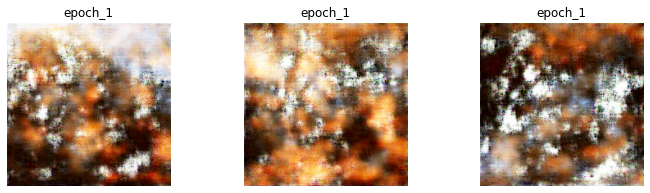

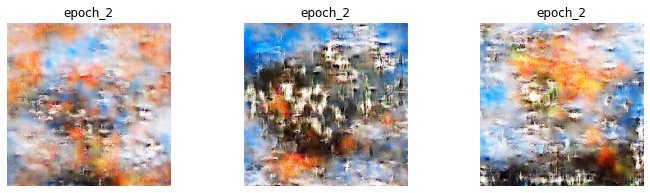

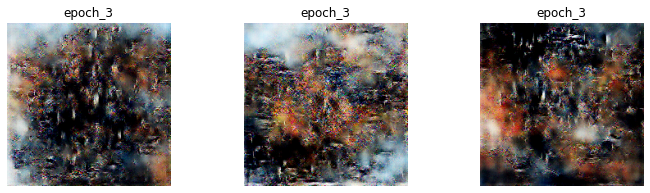

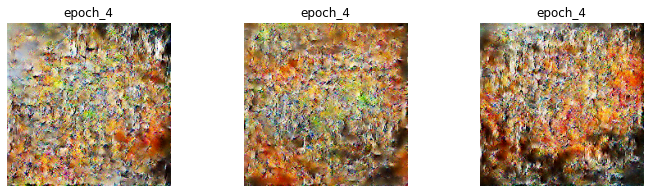

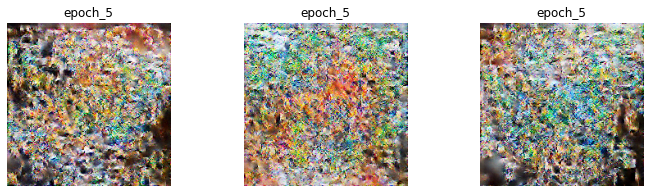

...

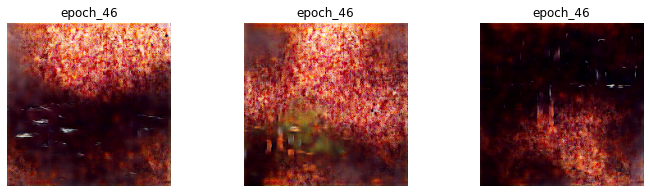

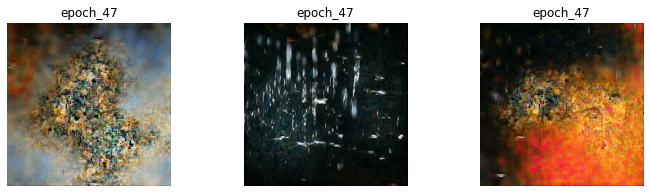

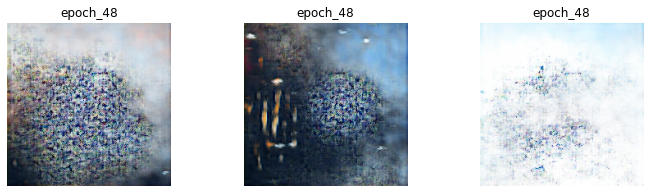

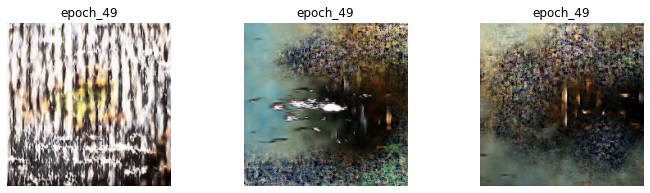

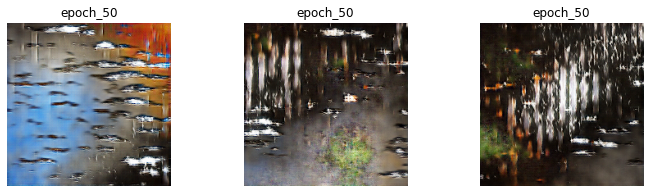

In [8]:
for p in range(50):
    cgan_predict('models/cgan_generator_ep'+str(p+1)+'.h5','epoch_'+str(p+1),vct_labels,100,cnt_img)